In [1]:
%matplotlib notebook

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib


import scipy as sp
from scipy import sparse

import os

import time

import pickle

from scipy.stats import gaussian_kde

from sklearn.neighbors import NearestNeighbors

from sklearn.metrics import pairwise_distances

from matplotlib import gridspec
import string

# Function to set size of plot

In [2]:
# Obtained from: https://kavigupta.org/2019/05/18/Setting-the-size-of-figures-in-matplotlib/

from matplotlib.image import imread
from tempfile import NamedTemporaryFile

def get_size(fig, dpi=100):
    with NamedTemporaryFile(suffix='.png') as f:
        fig.savefig(f.name, bbox_inches='tight', dpi=dpi)
        height, width, _channels = imread(f.name).shape
        return width / dpi, height / dpi

def set_size(fig, size, dpi=100, eps=1e-2, give_up=2, min_size_px=10):
    target_width, target_height = size
    set_width, set_height = target_width, target_height # reasonable starting point
    deltas = [] # how far we have
    while True:
        fig.set_size_inches([set_width, set_height])
        actual_width, actual_height = get_size(fig, dpi=dpi)
        set_width *= target_width / actual_width
        set_height *= target_height / actual_height
        deltas.append(abs(actual_width - target_width) + abs(actual_height - target_height))
        if deltas[-1] < eps:
            return True
        if len(deltas) > give_up and sorted(deltas[-give_up:]) == deltas[-give_up:]:
            return False
        if set_width * dpi < min_size_px or set_height * dpi < min_size_px:
            return False

# Import stuff

In [ ]:
tsne_default=np.load("variables/all_data/tsne_annealing_exgg_1_n_iter_10000/tsne.npy")
tsne_annealing=np.load("variables/all_data/tsne_exgg_1_n_iter_10000/tsne.npy")

In [63]:
#colors
automatic_colors=np.load("variables/automatic_colors.npy", allow_pickle=True)

# legend colors
pickle_in = open("variables/automatic_legend.pkl","rb")
automatic_legend = pickle.load(pickle_in)

# Plots

## Example 2

First zoom: we define the zoomed region directly in the data instead of with ```plt.xlim , plt.ylim``` because it is faster to plot only a subset of the points.

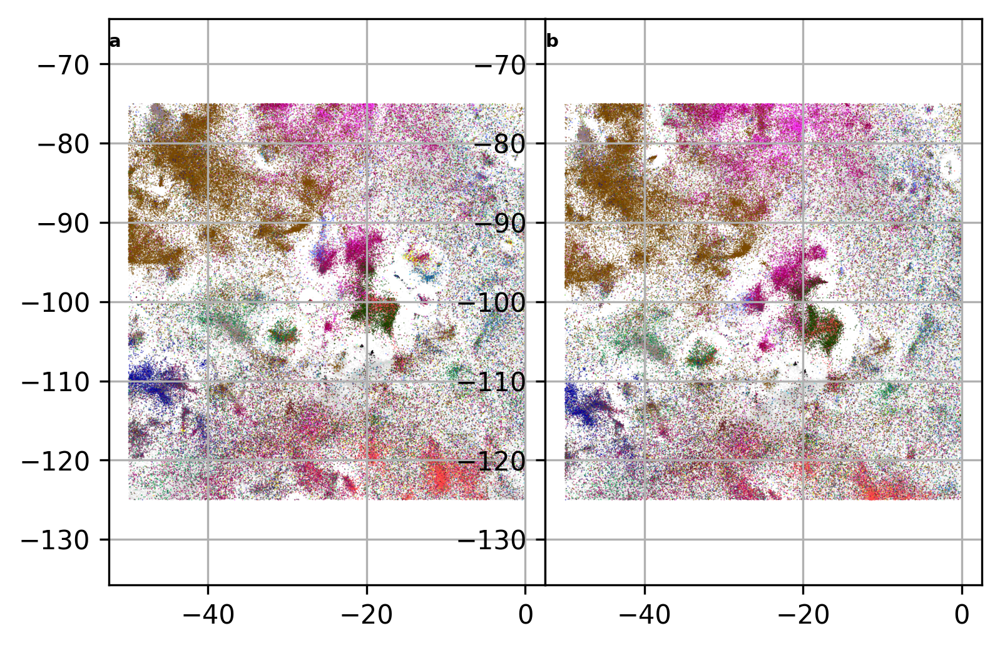

In [15]:
%matplotlib inline

# plot it
fig = plt.figure(dpi=300)
gs = gridspec.GridSpec(1,2)


##default
tsne=tsne_default
#zoom limits
right=0
left=-50
top=-75
bottom=-125
mask_colors = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors!='lightgrey')
mask_grey = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors=='lightgrey')

# plot
ax0 = plt.subplot(gs[0])
ax0.scatter(tsne[mask_grey,0],tsne[mask_grey,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax0.scatter(tsne[mask_colors,0],tsne[mask_colors,1],s=1,c=automatic_colors[mask_colors],alpha=0.5, marker='.',linewidths=None, ec='None', rasterized=True)
# extra
ax0.text(0, 0.95, string.ascii_lowercase[0], transform=ax0.transAxes, size=7, weight='bold')
ax0.axis('equal')
ax0.grid()


##annealing
tsne=tsne_annealing

mask_colors = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors!='lightgrey')
mask_grey = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors=='lightgrey')

#plot
ax1 = plt.subplot(gs[1])
ax1.scatter(tsne[mask_grey,0],tsne[mask_grey,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax1.scatter(tsne[mask_colors,0],tsne[mask_colors,1],s=1,c=automatic_colors[mask_colors],alpha=0.5, marker='.',linewidths=None, ec='None', rasterized=True)
#extra
ax1.text(0, 0.95, string.ascii_lowercase[1], transform=ax1.transAxes, size=7, weight='bold')
ax1.axis('equal')
ax1.grid()


plt.subplots_adjust(wspace=0.00005)

We manually define the mask for the region we want to select.

In [12]:
#mask island 2
tsne=tsne_default
right=-12
left=-14
top=-99
bottom=-101
mask_island_2=(tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom)

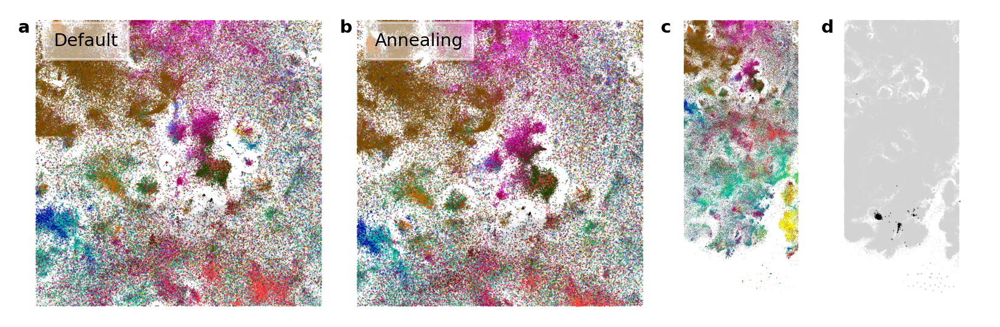

In [14]:
%matplotlib inline

# plot it
fig = plt.figure(dpi=300)
gs = gridspec.GridSpec(1,6)


##default
tsne=tsne_default

right=0
left=-50
top=-75
bottom=-125
mask_colors = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors!='lightgrey')
mask_grey = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors=='lightgrey')

# plot
ax0 = plt.subplot(gs[0:2])
ax0.scatter(tsne[mask_grey,0],tsne[mask_grey,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax0.scatter(tsne[mask_colors,0],tsne[mask_colors,1],s=1,c=automatic_colors[mask_colors],alpha=0.5, marker='.',linewidths=None, ec='None', rasterized=True)
# extra
ax0.text(0, 0.95, string.ascii_lowercase[0], transform=ax0.transAxes, size=7, weight='bold')
ax0.text(0.11,0.95,'Default', fontsize=7,transform=ax0.transAxes, ha='left', va= 'top', bbox=dict(facecolor='white',edgecolor='white', alpha=0.5))
ax0.axis('equal')
ax0.set_axis_off()
ax0.set_xlim(-50,0)
ax0.set_ylim(-125,-75)




##annealing
tsne=tsne_annealing
right=0
left=-50
top=-75
bottom=-125
mask_colors = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors!='lightgrey')
mask_grey = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors=='lightgrey')

#plot
ax1 = plt.subplot(gs[2:4])
ax1.scatter(tsne[mask_grey,0],tsne[mask_grey,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax1.scatter(tsne[mask_colors,0],tsne[mask_colors,1],s=1,c=automatic_colors[mask_colors],alpha=0.5, marker='.',linewidths=None, ec='None', rasterized=True)

#extra
ax1.text(0, 0.95, string.ascii_lowercase[1], transform=ax1.transAxes, size=7, weight='bold')
ax1.text(0.11,0.95,'Annealing', fontsize=7,transform=ax1.transAxes, ha='left', va= 'top', bbox=dict(facecolor='white',edgecolor='white', alpha=0.5))
ax1.axis('equal')
ax1.set_axis_off()
ax1.set_xlim(-50,0)
ax1.set_ylim(-125,-75)
 



##annealing
tsne=tsne_annealing
right=0
left=-50
top=-75
bottom=-200
mask_colors = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors!='lightgrey')
mask_grey = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors=='lightgrey')

#plot
ax2 = plt.subplot(gs[4])
ax2.scatter(tsne[mask_grey,0],tsne[mask_grey,1],s=0.1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax2.scatter(tsne[mask_colors,0],tsne[mask_colors,1],s=0.2,c=automatic_colors[mask_colors],alpha=0.5, marker='.',linewidths=None, ec='None', rasterized=True)

ax2.scatter(tsne[mask_island_2,0],tsne[mask_island_2,1],s=1,c=automatic_colors[mask_island_2],alpha=0.5, marker='.',linewidths=None,ec='None', rasterized=True)
#extra
ax2.text(0, 0.95, string.ascii_lowercase[2], transform=ax2.transAxes, size=7, weight='bold')
ax2.axis('equal')
ax2.set_axis_off()
ax2.set_xlim(-50,0)
ax2.set_ylim(-200,-75)




##grey annealing
tsne=tsne_annealing

mask_zoom = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors=='lightgrey')


# plot
ax3 = plt.subplot(gs[5])
ax3.scatter(tsne[mask_zoom,0],tsne[mask_zoom,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax3.scatter(tsne[mask_island_2,0],tsne[mask_island_2,1],s=1,c='black',alpha=0.5, marker='.',linewidths=None,ec='None', rasterized=True)
# extra
ax3.text(0, 0.95, string.ascii_lowercase[3], transform=ax3.transAxes, size=7, weight='bold')
ax3.axis('equal')
ax3.set_axis_off()
ax3.set_xlim(-50,0)
ax3.set_ylim(-200,-75)

plt.subplots_adjust(wspace=0.00005)

set_size(fig, (5.5, 1.8))
plt.savefig("figures/fig_A11.png", dpi=300, bbox_inches='tight')

# Example 3

First zoom

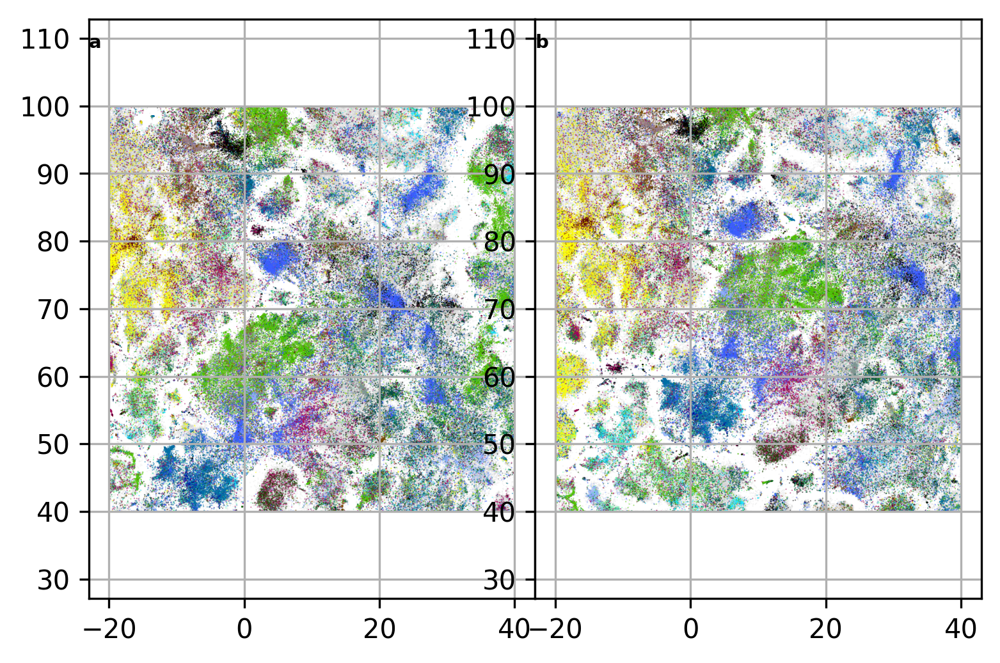

In [43]:
%matplotlib inline

# plot it
fig = plt.figure(dpi=300)
gs = gridspec.GridSpec(1,2)


##default
tsne=tsne_default
# zoom
right=40
left=-20
top=100
bottom=40
mask_colors = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors!='lightgrey')
mask_grey = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors=='lightgrey')

# plot
ax0 = plt.subplot(gs[0])
ax0.scatter(tsne[mask_grey,0],tsne[mask_grey,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax0.scatter(tsne[mask_colors,0],tsne[mask_colors,1],s=1,c=automatic_colors[mask_colors],alpha=0.5, marker='.',linewidths=None, ec='None', rasterized=True)
# extra
ax0.text(0, 0.95, string.ascii_lowercase[0], transform=ax0.transAxes, size=7, weight='bold')
ax0.axis('equal')
ax0.grid()


##annealing
tsne=tsne_annealing

mask_colors = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors!='lightgrey')
mask_grey = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors=='lightgrey')

# zoom=40
# mask_zoom_colors = (tsne[:,0]<tsne_paper[0]+zoom) & (tsne[:,0]>tsne_paper[0]-zoom) & (tsne[:,1]<tsne_paper[1]+zoom) & (tsne[:,1]>tsne_paper[1]-zoom) & (automatic_colors!='lightgrey')
# mask_zoom_grey = (tsne[:,0]<tsne_paper[0]+zoom) & (tsne[:,0]>tsne_paper[0]-zoom) & (tsne[:,1]<tsne_paper[1]+zoom) & (tsne[:,1]>tsne_paper[1]-zoom) & (automatic_colors=='lightgrey')

#plot
ax1 = plt.subplot(gs[1])
ax1.scatter(tsne[mask_grey,0],tsne[mask_grey,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax1.scatter(tsne[mask_colors,0],tsne[mask_colors,1],s=1,c=automatic_colors[mask_colors],alpha=0.5, marker='.',linewidths=None, ec='None', rasterized=True)
#extra
ax1.text(0, 0.95, string.ascii_lowercase[1], transform=ax1.transAxes, size=7, weight='bold')
ax1.axis('equal')
ax1.grid()

plt.subplots_adjust(wspace=0.00005)#, hspace=0.01)

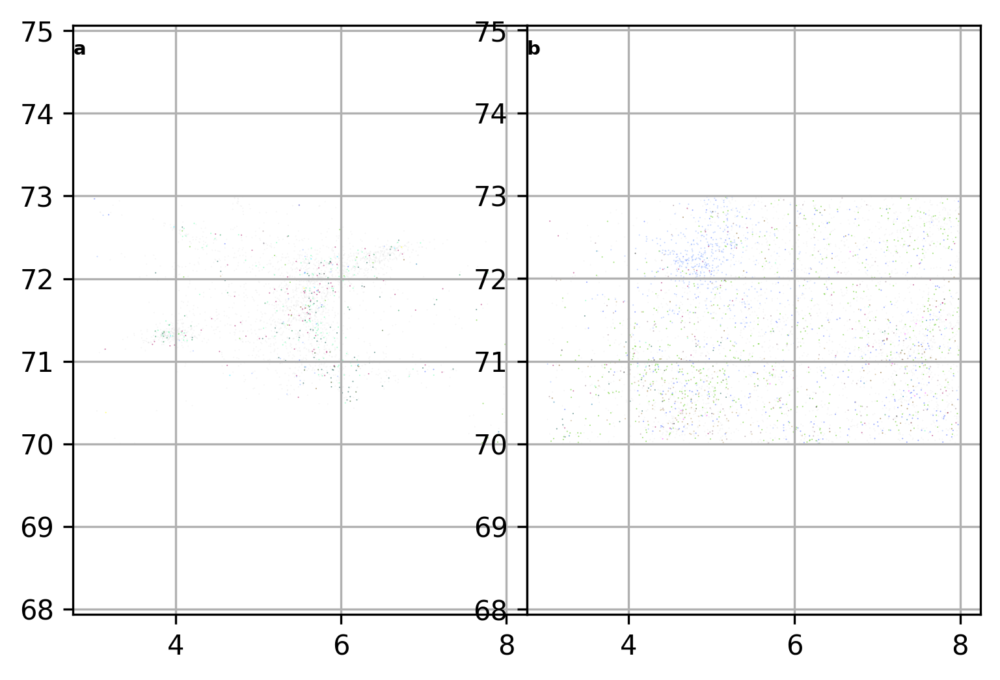

In [47]:
%matplotlib inline

# plot it
fig = plt.figure(dpi=300)
gs = gridspec.GridSpec(1,2)


##default
tsne=tsne_default

right=8
left=3
top=73
bottom=70
mask_colors = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors!='lightgrey')
mask_grey = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors=='lightgrey')

# plot
ax0 = plt.subplot(gs[0])
ax0.scatter(tsne[mask_grey,0],tsne[mask_grey,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax0.scatter(tsne[mask_colors,0],tsne[mask_colors,1],s=1,c=automatic_colors[mask_colors],alpha=0.5, marker='.',linewidths=None, ec='None', rasterized=True)
# extra
ax0.text(0, 0.95, string.ascii_lowercase[0], transform=ax0.transAxes, size=7, weight='bold')
ax0.axis('equal')
ax0.grid()


##annealing
tsne=tsne_annealing

mask_colors = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors!='lightgrey')
mask_grey = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors=='lightgrey')

#plot
ax1 = plt.subplot(gs[1])
ax1.scatter(tsne[mask_grey,0],tsne[mask_grey,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax1.scatter(tsne[mask_colors,0],tsne[mask_colors,1],s=1,c=automatic_colors[mask_colors],alpha=0.5, marker='.',linewidths=None, ec='None', rasterized=True)
#extra
ax1.text(0, 0.95, string.ascii_lowercase[1], transform=ax1.transAxes, size=7, weight='bold')
ax1.axis('equal')
ax1.grid()

plt.subplots_adjust(wspace=0.00005)

In [15]:
tsne=tsne_default
right=8
left=3
top=73
bottom=70
mask_island_4=(tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) 

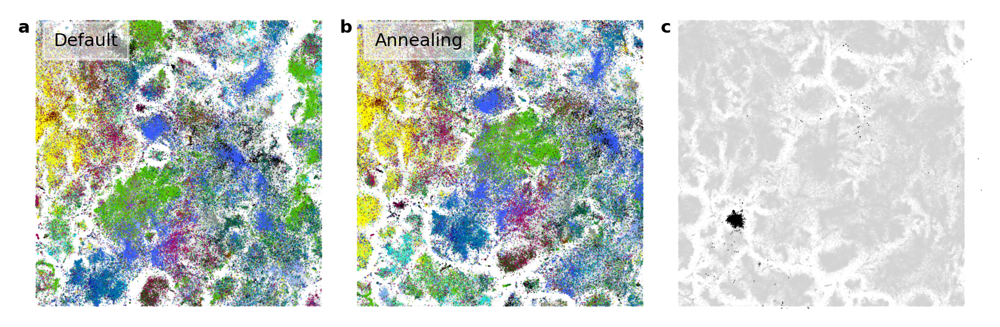

In [60]:
%matplotlib inline

fig = plt.figure(dpi=300)
gs = gridspec.GridSpec(1,3)

##default
tsne=tsne_default

right=40
left=-20
top=100
bottom=40
mask_colors = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors!='lightgrey')
mask_grey = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors=='lightgrey')

# plot
ax0 = plt.subplot(gs[0])
ax0.scatter(tsne[mask_grey,0],tsne[mask_grey,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax0.scatter(tsne[mask_colors,0],tsne[mask_colors,1],s=1,c=automatic_colors[mask_colors],alpha=0.5, marker='.',linewidths=None, ec='None', rasterized=True)
# extra
ax0.text(0, 0.95, string.ascii_lowercase[0], transform=ax0.transAxes, size=7, weight='bold')
ax0.text(0.11,0.95,'Default', fontsize=7,transform=ax0.transAxes, ha='left', va= 'top', bbox=dict(facecolor='white',edgecolor='white', alpha=0.5))
ax0.axis('equal')
ax0.set_axis_off()
ax0.set_xlim(-20,40)
ax0.set_ylim(40,100)



##annealing
tsne=tsne_annealing

mask_colors = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors!='lightgrey')
mask_grey = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors=='lightgrey')

#plot
ax1 = plt.subplot(gs[1])
ax1.scatter(tsne[mask_grey,0],tsne[mask_grey,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax1.scatter(tsne[mask_colors,0],tsne[mask_colors,1],s=1,c=automatic_colors[mask_colors],alpha=0.5, marker='.',linewidths=None, ec='None', rasterized=True)
#extra
ax1.text(0, 0.95, string.ascii_lowercase[1], transform=ax1.transAxes, size=7, weight='bold')
ax1.text(0.11,0.95,'Annealing', fontsize=7,transform=ax1.transAxes, ha='left', va= 'top', bbox=dict(facecolor='white',edgecolor='white', alpha=0.5))
ax1.axis('equal')
ax1.set_axis_off()
ax1.set_xlim(-20,40)
ax1.set_ylim(40,100)



##grey annealing
tsne=tsne_annealing
right=40
left=-20
top=100
bottom=40
mask_zoom = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) & (automatic_colors=='lightgrey')


# plot
ax2 = plt.subplot(gs[2])
ax2.scatter(tsne[mask_zoom,0],tsne[mask_zoom,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax2.scatter(tsne[mask_island_4,0],tsne[mask_island_4,1],s=1,c='black',alpha=0.5, marker='.',linewidths=None,ec='None', rasterized=True)
# extra
ax2.text(0, 0.95, string.ascii_lowercase[2], transform=ax2.transAxes, size=7, weight='bold')
ax2.axis('equal')
ax2.set_axis_off()
ax2.set_xlim(-20,40)
ax2.set_ylim(40,100)



plt.subplots_adjust(wspace=0.00005)

set_size(fig, (5.5, 1.8))
plt.savefig("figures/fig_A10.png", dpi=300, bbox_inches='tight')

# Example 1

In this example the zoom region is defined around a specific paper (Kobak & Berens (2019), title: “The art of using t-SNE for
single-cell transcriptomics”).

In [62]:
#import indices
paper_index=np.load("variables/paper_index.npy")

The mask was aswell selected manually.

In [64]:
#mask
tsne=tsne_default
mask=(tsne[:,0]<-76) & (tsne[:,0]>-79) & (tsne[:,1]<-16) & (tsne[:,1]>-19)  & (automatic_colors!='lightgrey')

True

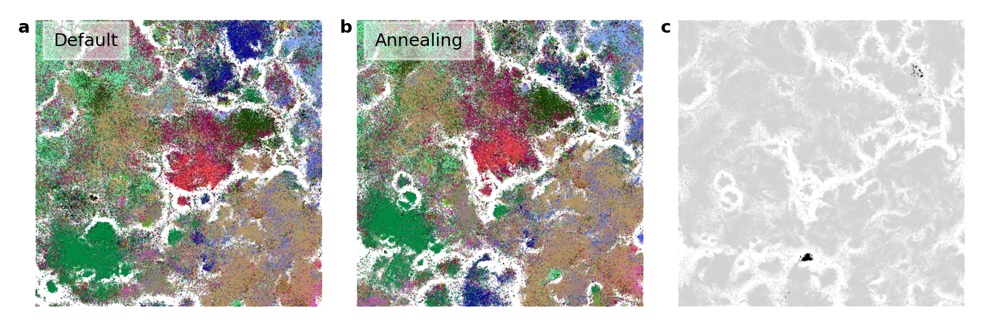

In [67]:
%matplotlib inline

# plot it
fig = plt.figure(dpi=300)
gs = gridspec.GridSpec(1,3)


##exgg=1 default
tsne=tsne_default
tsne_paper=tsne[paper_index]
zoom=40
mask_zoom_colors = (tsne[:,0]<tsne_paper[0]+zoom) & (tsne[:,0]>tsne_paper[0]-zoom) & (tsne[:,1]<tsne_paper[1]+zoom) & (tsne[:,1]>tsne_paper[1]-zoom) & (automatic_colors!='lightgrey')
mask_zoom_grey = (tsne[:,0]<tsne_paper[0]+zoom) & (tsne[:,0]>tsne_paper[0]-zoom) & (tsne[:,1]<tsne_paper[1]+zoom) & (tsne[:,1]>tsne_paper[1]-zoom) & (automatic_colors=='lightgrey')

# plot
ax0 = plt.subplot(gs[0])
ax0.scatter(tsne[mask_zoom_grey,0],tsne[mask_zoom_grey,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax0.scatter(tsne[mask_zoom_colors,0],tsne[mask_zoom_colors,1],s=1,c=automatic_colors[mask_zoom_colors],alpha=0.5, marker='.',linewidths=None, ec='None', rasterized=True)
# extra
ax0.text(0, 0.95, string.ascii_lowercase[0], transform=ax0.transAxes, size=7, weight='bold')
ax0.text(0.11,0.95,'Default', fontsize=7,transform=ax0.transAxes, ha='left', va= 'top', bbox=dict(facecolor='white',edgecolor='white', alpha=0.5))
ax0.axis('equal')
ax0.set_axis_off()
ax0.set_xlim(tsne_paper[0]-zoom,tsne_paper[0]+zoom)
ax0.set_ylim(tsne_paper[1]-zoom,tsne_paper[1]+zoom)




##annealing
tsne=tsne_annealing
tsne_paper=tsne[paper_index]
zoom=40
mask_zoom_colors = (tsne[:,0]<tsne_paper[0]+zoom) & (tsne[:,0]>tsne_paper[0]-zoom) & (tsne[:,1]<tsne_paper[1]+zoom) & (tsne[:,1]>tsne_paper[1]-zoom) & (automatic_colors!='lightgrey')
mask_zoom_grey = (tsne[:,0]<tsne_paper[0]+zoom) & (tsne[:,0]>tsne_paper[0]-zoom) & (tsne[:,1]<tsne_paper[1]+zoom) & (tsne[:,1]>tsne_paper[1]-zoom) & (automatic_colors=='lightgrey')
#plot
ax1 = plt.subplot(gs[1])
ax1.scatter(tsne[mask_zoom_grey,0],tsne[mask_zoom_grey,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax1.scatter(tsne[mask_zoom_colors,0],tsne[mask_zoom_colors,1],s=1,c=automatic_colors[mask_zoom_colors],alpha=0.5, marker='.',linewidths=None,ec='None', rasterized=True)
# extra
ax1.text(0, 0.95, string.ascii_lowercase[1], transform=ax1.transAxes, size=7, weight='bold')
ax1.text(0.11,0.95,'Annealing', fontsize=7,transform=ax1.transAxes, ha='left', va= 'top', bbox=dict(facecolor='white',edgecolor='white', alpha=0.5))
ax1.axis('equal')
ax1.set_axis_off()
ax1.set_xlim(tsne_paper[0]-zoom,tsne_paper[0]+zoom)
ax1.set_ylim(tsne_paper[1]-zoom,tsne_paper[1]+zoom)



##exgg=1 default
tsne=tsne_annealing
tsne_paper=tsne[paper_index]
zoom=40
mask2= mask & (tsne[:,1]>tsne_paper[1]-zoom)
# plot
ax2 = plt.subplot(gs[2])
ax2.scatter(tsne[mask_zoom_grey,0],tsne[mask_zoom_grey,1],s=1,c='lightgrey', alpha=0.2, marker='.',linewidths=None,ec='None', rasterized=True)
ax2.scatter(tsne[mask2,0],tsne[mask2,1],s=1,c='black',alpha=0.5, marker='.',linewidths=None,ec='None', rasterized=True)
# extra
ax2.text(0, 0.95, string.ascii_lowercase[2], transform=ax2.transAxes, size=7, weight='bold')
ax2.axis('equal')
ax2.set_xlim(tsne_paper[0]-zoom,tsne_paper[0]+zoom)
ax2.set_ylim(bottom=tsne_paper[1]-zoom,top=tsne_paper[1]+zoom)
ax2.set_axis_off()

plt.subplots_adjust(wspace=0.00005)
set_size(fig, (5.5, 1.8))
plt.savefig("figures/fig_3.png", dpi=300, bbox_inches='tight')